# Use POCA Ellipsoid info to match Tracks to Primary Vertices
_____
The goal of this notebook is to attempt to match tracks to primary vertices using the mean and widths of the POCA error ellipsoids

___
<span style="color: blue;">First, let's check to see which GPUs are currently being used:</span>

In [1]:
!nvidia-smi

Wed Jun 30 14:53:46 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.56       CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  On   | 00000000:18:00.0 Off |                  N/A |
| 29%   43C    P8    41W / 250W |   3985MiB / 11019MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 208...  On   | 00000000:3B:00.0 Off |                  N/A |
| 29%   

In [2]:
import numba
numba.__version__

'0.53.1'

___
<span style="color: blue;">Now, we can select which machine we want to use:</span>

In [3]:
from model.training import select_gpu
device = select_gpu(-1)

___
<span style="color: blue;">Here, we import everything we need. The ellipsoid functions imported from model.plots_mdsA_200518 are originally from the Towards_Ellipsoids_*.ipynb notebooks. The model used in this notebook is the four-feature, 6-layer CNN.</span>

In [4]:
#import libraries
import matplotlib.pyplot as plt
import matplotlib as mpl
mpl.style.use('classic')
import numpy as np
import torch
import math as m
import warnings
import numba
try:
    import awkward0 as awkward
except ModuleNotFoundError:
    import awkward
concatenate = awkward.concatenate
from matplotlib.patches import Ellipse
import sys
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
import pandas as p

from scipy.optimize import curve_fit

# This can throw a warning about float - let's hide it for now.
with warnings.catch_warnings():
    warnings.simplefilter("ignore", category=FutureWarning)
    import h5py

#local imports
from model.models_mds_F import FourFeature_CNN6Layer_D as Model
from model.collectdata_poca_KDE import collect_data_poca
from model.collectdata_sakar_TPVA import collect_truth
from model.plots_emk_200518 import gaussian, plot_ruiplot
from model.efficiency_res_optimized import get_std_resolution
from model.efficiency import pv_locations, efficiency
from model.core import modernize

In [5]:
def gauss_fitfunction(x, *p):
    A, mu, sigma = p
    return A*np.exp(-(x-mu)**2/(2.*sigma**2))

In [6]:
def collect_poca(*files):
    
    #initialize lists
    pocax_list = []
    pocay_list = []
    pocaz_list = []

    majoraxisx_list = []
    majoraxisy_list = []
    majoraxisz_list = []

    minoraxis1x_list = []
    minoraxis1y_list = []
    minoraxis1z_list = []
    minoraxis2x_list = []
    minoraxis2y_list = []
    minoraxis2z_list = []

    match_list = []
    
    #iterate through all files
    for XY_file in files:
        
        
#         msg = f"Loaded {XY_file} in {{time:.4}} s"
        with h5py.File(XY_file, mode="r") as XY:

             #print keys in current hdf5 file
             print(XY.keys())
                
             #print(XY["poca_x"])
             afile = awkward.hdf5(XY)
                
             print(np.asarray(XY["poca_x"]))

             #append to appropriate lists
             pocax_list.append(afile["poca_x"])
             pocay_list.append(afile["poca_y"])
             pocaz_list.append(afile["poca_z"])

             majoraxisx_list.append(afile["major_axis_x"])
             majoraxisy_list.append(afile["major_axis_y"])
             majoraxisz_list.append(afile["major_axis_z"])

             minoraxis1x_list.append(afile["minor_axis1_x"])
             minoraxis1y_list.append(afile["minor_axis1_y"])
             minoraxis1z_list.append(afile["minor_axis1_z"])

             minoraxis2x_list.append(afile["minor_axis2_x"])
             minoraxis2y_list.append(afile["minor_axis2_y"])
             minoraxis2z_list.append(afile["minor_axis2_z"])
            
             match_list.append(afile["recon_pv_key"])
    
    #construct pocas dictionary
    pocas = {}
    pocas["x"] = {"poca": concatenate(pocax_list),
                  "major_axis": concatenate(majoraxisx_list),
                  "minor_axis1": concatenate(minoraxis1x_list),
                  "minor_axis2": concatenate(minoraxis2x_list)}

    pocas["y"] = {"poca": concatenate(pocay_list),
                  "major_axis": concatenate(majoraxisy_list),
                  "minor_axis1": concatenate(minoraxis1y_list),
                  "minor_axis2": concatenate(minoraxis2y_list)}

    pocas["z"] = {"poca": concatenate(pocaz_list),
                  "major_axis": concatenate(majoraxisz_list),
                  "minor_axis1": concatenate(minoraxis1z_list),
                  "minor_axis2": concatenate(minoraxis2z_list)}

    return pocas, concatenate(match_list)

___
<span style="color: blue;">Now, we load our validation dataset, using the method imported from model.collectdata_poca_KDE. The validation set is created in slices of 500. Masking is set to True, and shuffle is set to False in order to retain the order of events. The device is set to that which we previously specified.</span>

In [7]:
#specify the path to the dataset (here, dataAA is a symlink to /share/lazy/sokoloff/ML-data_AA)
#file = '/share/lazy/sokoloff/ML-data_AA/1K_POCA_HLT1CPU_poca_kernel_evts_201022.h5'
#file = '/share/lazy/sokoloff/ML-data_AA/pv_HLT1CPU_MinBiasMagUp_14Nov.h5'
file = '/share/lazy/sakar/ML_data/pv_HLT1CPU_MinBiasMagUp_TPVA.h5'
validation = collect_data_poca(file,
                          batch_size=1,
                          slice=slice(10000),
                          masking=True, shuffle=False,
                          #device=device,
                          load_XandXsq=True,
                          load_xy=True)

Loading data...
Loaded /share/lazy/sakar/ML_data/pv_HLT1CPU_MinBiasMagUp_TPVA.h5 in 16.23 s
Constructing 10000 event dataset took 0.1002 s


In [8]:
pocas, track_matches = collect_poca(file)

<KeysViewHDF5 ['Xmax', 'Ymax', 'kernel', 'major_axis_x', 'major_axis_y', 'major_axis_z', 'minor_axis1_x', 'minor_axis1_y', 'minor_axis1_z', 'minor_axis2_x', 'minor_axis2_y', 'minor_axis2_z', 'poca_KDE_A', 'poca_KDE_A_xMax', 'poca_KDE_A_yMax', 'poca_KDE_B', 'poca_KDE_B_xMax', 'poca_KDE_B_yMax', 'poca_x', 'poca_y', 'poca_z', 'pv', 'pv_cat', 'pv_key', 'pv_loc', 'pv_loc_x', 'pv_loc_y', 'pv_ntracks', 'pv_other', 'recon_pv_key', 'recon_tx', 'recon_x', 'recon_y', 'recon_z', 'sv', 'sv_cat', 'sv_loc', 'sv_loc_x', 'sv_loc_y', 'sv_ntracks', 'sv_other']>
['1' '3' 'schema.json']


In [9]:
print(track_matches[0])

[ 602.   75.   75.  602.  452.  286.   75.  373.  412.   75.  521.   75.
  286. -999.  373.  286.  521. -999.  286.   75.  602.  602.   75.   75.
  373.  602.   75.  521.   75.   75. -999.  602.   75.   75.   75.   75.
  602.   75.  373.  286.   75.  602. -999. -999. -999.   75.  286.   75.
  602.   75. -999.  521.   75.   75.  373.  602. -999.  602.   75.   75.
   75.  602.  602.  412.  602.  602.  373.  521.   75.   75.   75.  373.
  521.  521.  602.  602.  602.  602.  602.  602.  602.   75.  602.  373.
   75.   75.    0.  373.   75. -999.  521.  521.  286.  602.  602.  286.
  602. -999.  602. -999.  602.  602.  602.  602.  602.   75.   75.   75.
    0.    0.   75.   75.   75.  521.  373.  483.  521.  521.  286.  602.
  602.  286.  602.  286.  602.  602.  286.  602.   75.   75.   75.   75.
   75.   75.   75.  373. -999. -999.  286.   75.   75.    0.   75.    0.
 -999.   75.  521.   75.  373.   75.   75.   75.  373.  373.    0.   75.
    0.    0.   75.   75.   75.    0.    0.   75.   

___
<span style="color: blue;">Now we load the Xmax and Ymax arrays from the hdf5 file:</span>

In [10]:
with h5py.File(file, mode='r') as XY:
    #assign numpy arrays corresponding to xmax and ymax
    xmax = np.asarray(XY['Xmax'])
    ymax = np.asarray(XY['Ymax'])

___
<span style="color: blue;">Now we collect the truth information from the hdf5 file corresponding to the primary vertices (pvs = True) and print some examples.</span>

In [11]:
PV = collect_truth(file, pvs=True)
ind = 0
print('PV.n.shape =    ',  PV.n.shape)
print(f'PV.n[{ind}].shape = ', *PV.n[ind].shape)
print(f'PV.x[{ind}] =       ', *PV.x[ind])
print(f'PV.y[{ind}] =       ', *PV.y[ind])
print(f'PV.z[{ind}] =       ', *PV.z[ind])
print(f'PV.n[{ind}] =       ', *PV.n[ind])
print(f'PV.cat[{ind}] =     ', *PV.cat[ind])
print(f'PV.key[{ind}] =     ', *PV.key[ind])

Loaded /share/lazy/sakar/ML_data/pv_HLT1CPU_MinBiasMagUp_TPVA.h5 in 0.02046 s
PV.n.shape =     (51980,)
PV.n[0].shape =  11
PV.x[0] =        -0.0396 0.0155 0.0043 -0.0027 0.0548 0.0204 -0.0377 -0.0384 -0.0188 0.0136 -0.0047
PV.y[0] =        0.0095 -0.0427 0.005 -0.0105 -0.0134 0.0126 0.07 -0.0068 0.0239 -0.0223 -0.0323
PV.z[0] =        -13.2912 -3.9851 55.7932 -53.5683 12.2541 89.1668 -75.9433 29.4695 19.3484 74.7049 -22.578
PV.n[0] =        38 83 32 0 16 14 6 10 22 74 0
PV.cat[0] =      1 1 1 -1 1 1 1 1 1 1 -1
PV.key[0] =      0.0 75.0 286.0 372.0 373.0 412.0 452.0 483.0 521.0 602.0 759.0


___
<span style="color: blue;">We repeat the process for secondary vertices:</span>

In [12]:
SV = collect_truth(file, pvs=False)
ind = 0
print('SV.n.shape =    ', SV.n.shape)
print(f'SV.n[{ind}].shape = ', *SV.n[ind].shape)
print(f'SV.x[{ind}] =       ', *SV.x[ind])
print(f'SV.y[{ind}] =       ', *SV.y[ind])
print(f'SV.z[{ind}] =       ', *SV.z[ind])
print(f'SV.n[{ind}] =       ', *SV.n[ind])
print(f'SV.cat[{ind}] =     ', *SV.cat[ind])

Loaded /share/lazy/sakar/ML_data/pv_HLT1CPU_MinBiasMagUp_TPVA.h5 in 0.2443 s
SV.n.shape =     (51980,)
SV.n[0].shape =  190
SV.x[0] =        -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 -0.0396 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0155 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0043 0.0548 0.0548 0.0548 0.0548 0.0548 0.0548 0.0548 0.0548 0.0548 0.0204 0.0204 0.0204 0.0204 0.0204 0.0204 0.0204 0.0204 -0.0377 -0.0377 -0.0384 -0.0384 -0.0384 -0.0384 -0.0384 -0.0384 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 -0.0188 0.0136 0.0136 0.0136 0.0136 0.0136 

___
<span style="color: blue;">Now we need to load the model:</span>

In [13]:
#specify name of trained model
name = '/share/lazy/sokoloff/ML/Aug16_FourFeature_CNN6LayerPlus_TargetsAA_YetAnother100epochs_160K_lr_1em4_bs128_Alt_Loss_A_4p5/Aug16_FourFeature_CNN6LayerPlus_TargetsAA_YetAnother100epochs_160K_lr_1em4_bs128_Alt_Loss_A_4p5_final.pyt'
model = Model().to(device)
d = torch.load(name, map_location=torch.device('cpu'))
d = modernize(d, 3)

#load and evaluate model
model.load_state_dict(d)
model.eval()

FourFeature_CNN6Layer_D(
  (conv1): Conv1d(2, 25, kernel_size=(25,), stride=(1,), padding=(12,))
  (conv2): Conv1d(25, 25, kernel_size=(15,), stride=(1,), padding=(7,))
  (conv3): Conv1d(25, 25, kernel_size=(15,), stride=(1,), padding=(7,))
  (conv4of6): Conv1d(25, 25, kernel_size=(15,), stride=(1,), padding=(7,))
  (conv5of6): Conv1d(25, 1, kernel_size=(5,), stride=(1,), padding=(2,))
  (finalFilter): Conv1d(1, 1, kernel_size=(91,), stride=(1,), padding=(45,))
  (ppConv1): Conv1d(2, 10, kernel_size=(25,), stride=(1,), padding=(12,))
  (ppConv2): Conv1d(10, 5, kernel_size=(15,), stride=(1,), padding=(7,))
  (ppConv3): Conv1d(5, 1, kernel_size=(5,), stride=(1,), padding=(2,))
  (ppFc1): Linear(in_features=4000, out_features=4000, bias=True)
  (ppFinalFilter): Conv1d(1, 1, kernel_size=(91,), stride=(1,), padding=(45,))
  (conv1dropout): Dropout(p=0.15, inplace=False)
  (conv2dropout): Dropout(p=0.15, inplace=False)
  (conv3dropout): Dropout(p=0.15, inplace=False)
  (conv4dropout): Dropou

___
<span style="color: blue;">Create numpy arrays corresponding to the outputs and labels of the model:</span>

In [14]:
with torch.no_grad():
    outputs = model(validation.dataset.tensors[0]).cpu().numpy()
    labels = validation.dataset.tensors[1].cpu().numpy()

___
<span style="color: blue;">Create numpy array corresponding to the test dataset:</span>

In [15]:
test = validation.dataset.tensors[0].cpu().numpy()
print('test.shape = ',test.shape)

test.shape =  (10000, 4, 4000)


In [16]:
print(PV.x[0])
print(PV.y[0])
print(PV.key[0])

[-0.0396  0.0155  0.0043 -0.0027  0.0548  0.0204 -0.0377 -0.0384 -0.0188
  0.0136 -0.0047]
[ 0.0095 -0.0427  0.005  -0.0105 -0.0134  0.0126  0.07   -0.0068  0.0239
 -0.0223 -0.0323]
[  0.  75. 286. 372. 373. 412. 452. 483. 521. 602. 759.]


___
<span style="color: blue;">Finally, we can create our plots:</span>

In [59]:
inputs = validation.dataset.tensors[0].cpu().numpy()[:,0,:]
zvals = np.linspace(-100, 300, 4000, endpoint=False) + 0.05

# initialize arrays/lists
missed_ratio = [] #of unmatched tracks, how many should have been matched to valid PVs
correct_ratio = [] #ratio of correctly matched tracks / total
ratios = np.zeros(test.shape[0]) #ratio of matched tracks / total
stds = [] #keep track of window size used to match tracks
deltazmin_matched = [] #distance of track to PV for matched tracks
deltazmin_unmatched = [] #distance of track to PV for unmatched tracks
deltax_PV = []
deltay_PV = []
deltaz_PV = []

#initialize dictionaries (used to see trends w.r.t. number of tracks per PV)
resolution_dict_z = {}
resolution_dict_x = {}
resolution_dict_y = {}
resolution_dict_z_best = {}
resolution_dict_x_best = {}
resolution_dict_y_best = {}
ratio_dict = {}
resolution_dict_z_pvf = {}

#colors used to show which tracks are matched to which PVs
PV_colors = ['brown','red','orangered','orange','gold','olive','lawngreen','green',
             'springgreen','turquoise','cyan','deepskyblue','dodgerblue','navy','blue',
            'indigo','darkviolet','purple','magenta','deeppink']

# ITERATE THROUGH EACH EVENT
for event in range(test.shape[0]):
    
    n_correct = 0
    n_false = 0
    
    #assign current input, label, and output for event
    input = inputs[event]
    label = labels[event]
    output = outputs[event]
    
    # Consistent parameters for the calls below
    parameters = {
        "threshold": 1e-2,
        "integral_threshold": .2,
        "min_width": 3
    }
    
    # Compute the "actual" efficencies and things
    ftruth = pv_locations(label, **parameters)
    fcomputed = pv_locations(output, **parameters)
    results = efficiency(label, output, difference=5.0, **parameters)
    
    # Make sure bin numbers are integers
    truth = np.around(ftruth).astype(np.int32)
    computed = np.around(fcomputed).astype(np.int32)
    
    print(f"\nEvent {event}:", results)
    
    #grab means of predicted PVs
    comp_centroids = (fcomputed / 10) - 100
    
    #find standard deviations of predicted PVs
    std = get_std_resolution(fcomputed, output, 3.5, 0.001, 20, 0)
    std = std/10
    
    #reset these values to zero before iterating through tracks
    n_matched = 0
    n_missed = 0
    
    maxy = 0 #used for plotting
    
    #initialize match dictionaries
    matches = {}
    for i in range(len(comp_centroids)):
        matches[i] = []
        
    unmatched = {}
    for i in range(len(comp_centroids)):
        unmatched[i] = []
    
    minmatched = sys.float_info.max # used for deltaz_minmatched (initialize then update in loop)
    minunmatched = sys.float_info.max # used for deltaz_minunmatched (initialize then update in loop)
    
    heights = np.zeros(len(pocas["z"]["poca"][event])) # used to calculate weights to compute weighted average of matched tracks to reconstruct PVs
    
    # ITERATE THROUGH TRACKS
    for j in range(len(pocas["z"]["poca"][event])):
        
        # compute array corresponding to z-projection of POCA ellipsoid, then store max
        current_gauss = gaussian(zvals, pocas["z"]["poca"][event][j], pocas["z"]["major_axis"][event][j])
        heights[j] = 1/(pocas["z"]["major_axis"][event][j]*np.sqrt(2*np.pi))
        
        
        # below used for plotting
        if maxy<heights[j]:
            maxy = heights[j]
            
        # (sometimes, we encounter events where no PVs are found)
        if not len(comp_centroids)==0:
            
            #find PV (and index) with minimum distance to track
            diff = np.abs(np.add(comp_centroids, -pocas["z"]["poca"][event][j]))
            minimum = diff.min()
            ind = np.where(diff == minimum)[0][0]
            
            #calculate and store window with which to decide matching
            std_mod = np.sqrt(pocas["z"]["major_axis"][event][j]**2 + std[ind]**2)
            stds.append(std_mod)
            
            if minimum <= 5*std_mod:
                #uncomment below for plotting
                #plt.plot(zvals, current_gauss, color = PV_colors[ind])
                
                
                n_matched += 1 #count number of matched tracks
                matches[ind].append(j) #keep track of match
                
                #below used for deltazmin_matched
                if minimum <= minmatched:
                    minmatched = minimum
            else:
                #uncomment below for plotting
                #plt.plot(zvals, current_gauss, color = 'k')
                
                #below used for deltazmin_unmatched
                unmatched[ind].append(j)
                if minimum <= minunmatched:
                    minunmatched = minimum
    
    print("Percentage Matched = ", 100*n_matched/len(pocas["z"]["poca"][event]), "%")
    
    #update lists
    ratios[event] = n_matched/len(pocas["z"]["poca"][event])
    deltazmin_matched.append(minmatched)
    deltazmin_unmatched.append(minunmatched)
    
    
    #uncomment below for plotting (to plot PVs)
    #for j in range(len(comp_centroids)):
        #plt.plot(comp_centroids[j], np.ones_like(comp_centroids[j])*.4, 'o', color= PV_colors[j], markeredgecolor = 'k')
        
    #plt.xlim([zvals[0],zvals[-1]])
    #plt.ylim([0,1.2*maxy])
    #plt.show()
    
    # initialize arrays to store PV locations calculated from matched track POCAs
    x_guesses = np.zeros(len(comp_centroids))
    y_guesses = np.zeros(len(comp_centroids))
    z_guesses = np.zeros(len(comp_centroids))
    
    n_tracks = np.zeros(len(comp_centroids)) # stores number of matched tracks per PV
    
    key_guesses = [] #stores truth indices of matched tracks
    keys_unmatched = [] #stores truth indices of unmatched tracks
    
    # iterate through dictionary of track matches
    for i in matches:
        
        #compute weighted average of track POCA positions to approximate PV loc
        x_guesses[i] = np.average([pocas["x"]["poca"][event][j] for j in matches[i]], 
                                  weights = [heights[j] for j in matches[i]])
        y_guesses[i] = np.average([pocas["y"]["poca"][event][j] for j in matches[i]], 
                                  weights = [heights[j] for j in matches[i]])
        z_guesses[i] = np.average([pocas["z"]["poca"][event][j] for j in matches[i]], 
                                  weights = [heights[j] for j in matches[i]])
        
        n_tracks[i] = len(matches[i])
        
        key_guesses.append([track_matches[event][j] for j in matches[i]])
        keys_unmatched.append([track_matches[event][j] for j in unmatched[i]])
        
    # find the indices of the truth PVs which correspond to the PVs found by pv-finder
    true_ind = np.zeros(len(comp_centroids))
    for j in range(len(comp_centroids)):
        true_ind[j] = min(range(len(PV.z[event])), key=lambda i: abs(PV.z[event][i]-comp_centroids[j]))
    
    # construct arrays corresponding to truth x,y,z positions of PVs and IDs (key)
    true_x = [PV.x[event][int(i)] for i in true_ind]
    true_y = [PV.y[event][int(i)] for i in true_ind]
    true_z = [PV.z[event][int(i)] for i in true_ind]
    true_key = [PV.key[event][int(i)] for i in true_ind]
    
    # find out how many were correctly/falsely matched
    for i in range(len(true_key)):
        for j in range(len(key_guesses[i])):
            if not true_key[i]==key_guesses[i][j]:
                n_false+=1
            else:
                n_correct+=1
        for j in range(len(keys_unmatched[i])):
            if keys_unmatched[i][j] in true_key:
                n_missed+=1
            
    # append to a few macro lists
    if not len(pocas["z"]["poca"][event])-n_matched ==0:
        missed_ratio.append(n_missed/(len(pocas["z"]["poca"][event])-n_matched))
    
    if not n_false + n_correct ==0:
        correct_ratio.append(n_correct/(n_false+n_correct))
        
    print('Number Correct: ', n_correct)
            
    x_guesses_best = np.zeros(len(true_key))
    y_guesses_best = np.zeros(len(true_key))
    z_guesses_best = np.zeros(len(true_key))
    
    n_correct_total = 0
    for i in range(len(true_key)):
        xvals = []
        yvals = []
        zvals = []
        heightvals = []
        for j in range(len(track_matches[event])):
            if track_matches[event][j] == true_key[i]:
                xvals.append(pocas["x"]["poca"][event][j])
                yvals.append(pocas["y"]["poca"][event][j])
                zvals.append(pocas["z"]["poca"][event][j])
                heightvals.append(heights[j])
        n_correct_total += len(heightvals)
        if len(heightvals)>0:
            x_guesses_best[i] = np.average(xvals, weights = heightvals)
            y_guesses_best[i] = np.average(yvals, weights = heightvals)
            z_guesses_best[i] = np.average(zvals, weights = heightvals)
                
            
    print('Possible Number of Matches: ', n_correct_total)
            
    deltax_PV_best = np.add(true_x, -x_guesses_best).tolist()
    deltay_PV_best = np.add(true_y, -y_guesses_best).tolist()
    deltaz_PV_best = np.add(true_z, -z_guesses_best).tolist()
            
    # compute difference between truth positions and positions calculated using POCAs
    deltax_PV_current = np.add(true_x, -x_guesses).tolist()   
    deltay_PV_current = np.add(true_y, -y_guesses).tolist()
    deltaz_PV_current = np.add(true_z, -z_guesses).tolist()
    
    # append to macro lists
    deltax_PV += deltax_PV_current
    deltay_PV += deltay_PV_current
    deltaz_PV += deltaz_PV_current
    
    # to compare POCA reconstruction to pv-finder (pvf) output
    deltaz_PV_pvf = np.add(true_z, -comp_centroids).tolist()
    
    # UPDATE DICTIONARIES
    for i in range(len(n_tracks)):
        
        if n_tracks[i] in resolution_dict_z:
            resolution_dict_z[n_tracks[i]].append(deltaz_PV_current[i])
        else:
            resolution_dict_z[n_tracks[i]] = [deltaz_PV_current[i]]
        
        if n_tracks[i] in resolution_dict_x:
            resolution_dict_x[n_tracks[i]].append(deltax_PV_current[i])
        else:
            resolution_dict_x[n_tracks[i]] = [deltax_PV_current[i]]
            
        if n_tracks[i] in resolution_dict_y:
            resolution_dict_y[n_tracks[i]].append(deltay_PV_current[i])
        else:
            resolution_dict_y[n_tracks[i]] = [deltay_PV_current[i]]
            
        if n_tracks[i] in resolution_dict_z_best:
            resolution_dict_z_best[n_tracks[i]].append(deltaz_PV_best[i])
        else:
            resolution_dict_z_best[n_tracks[i]] = [deltaz_PV_best[i]]
        
        if n_tracks[i] in resolution_dict_x_best:
            resolution_dict_x_best[n_tracks[i]].append(deltax_PV_best[i])
        else:
            resolution_dict_x_best[n_tracks[i]] = [deltax_PV_best[i]]
            
        if n_tracks[i] in resolution_dict_y_best:
            resolution_dict_y_best[n_tracks[i]].append(deltay_PV_best[i])
        else:
            resolution_dict_y_best[n_tracks[i]] = [deltay_PV_best[i]]
            
        if n_tracks[i] in ratio_dict:
            ratio_dict[n_tracks[i]].append(ratios[event])
        else:
            ratio_dict[n_tracks[i]] = [ratios[event]]
            
        if n_tracks[i] in resolution_dict_z_pvf:
            resolution_dict_z_pvf[n_tracks[i]].append(deltaz_PV_pvf[i])
        else:
            resolution_dict_z_pvf[n_tracks[i]] = [deltaz_PV_pvf[i]]
            
    # uncomment below for plotting
#     plt.plot(x_guesses, y_guesses, 'o', color = 'g', label = "from POCA")
#     plt.plot(true_x, true_y, 'o', color = 'b', label = "truth")
#     plt.legend()
#     title = f"\nEvent {event}:" + str(results)
#     plt.title(title)
#     plt.xlabel('x')
#     plt.ylabel('y')
#     plt.show()




Event 0: Found 9 of 9, added 1 (eff 100.00%)
Percentage Matched =  91.50943396226415 %
Number Correct:  268
Possible Number of Matches:  372

Event 1: Found 6 of 6, added 0 (eff 100.00%)
Percentage Matched =  68.05555555555556 %
Number Correct:  172
Possible Number of Matches:  196

Event 2: Found 3 of 3, added 0 (eff 100.00%)
Percentage Matched =  32.47863247863248 %
Number Correct:  106
Possible Number of Matches:  114

Event 3: Found 5 of 5, added 0 (eff 100.00%)
Percentage Matched =  71.1038961038961 %
Number Correct:  190
Possible Number of Matches:  216

Event 4: Found 4 of 4, added 1 (eff 100.00%)
Percentage Matched =  87.25490196078431 %
Number Correct:  132
Possible Number of Matches:  179

Event 5: Found 3 of 3, added 1 (eff 100.00%)
Percentage Matched =  84.67153284671532 %
Number Correct:  222
Possible Number of Matches:  237

Event 6: Found 4 of 4, added 0 (eff 100.00%)
Percentage Matched =  92.07920792079207 %
Number Correct:  172
Possible Number of Matches:  186

Event 

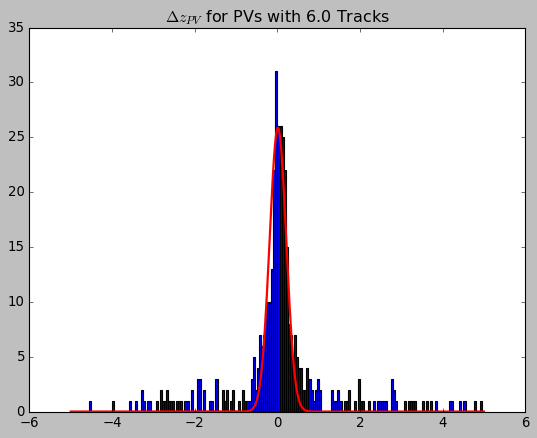

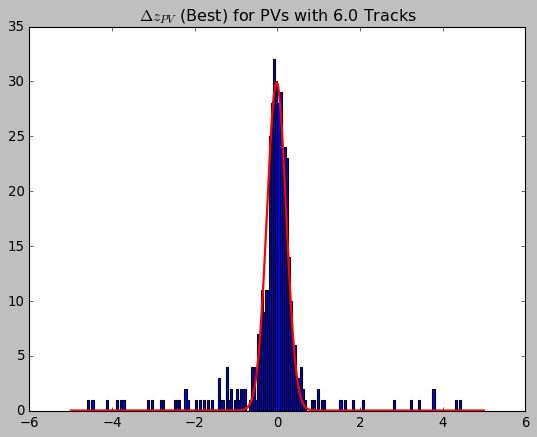

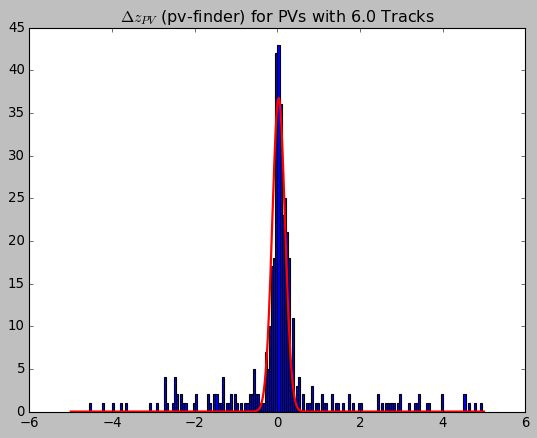

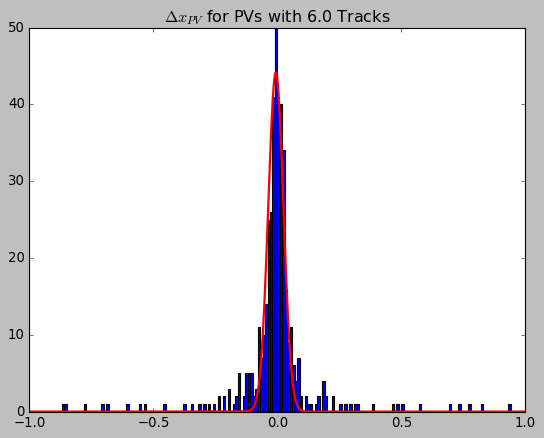

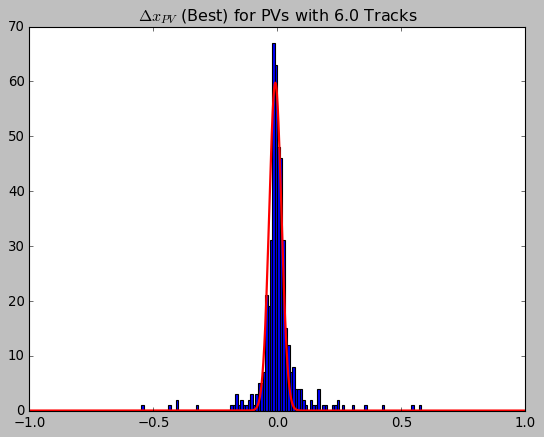

...

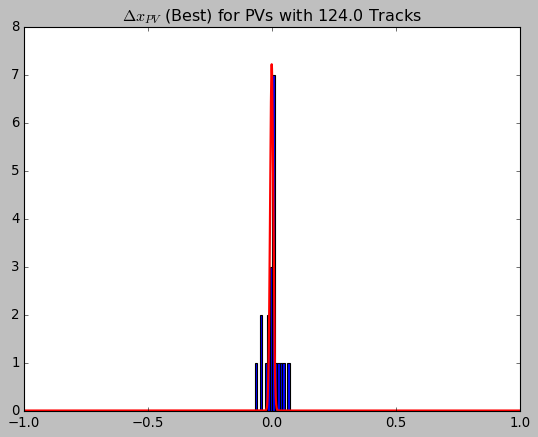

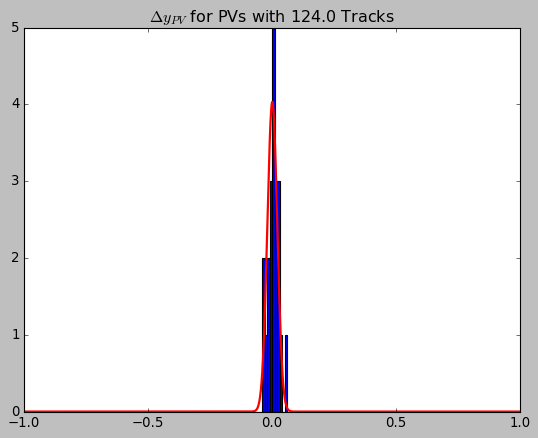

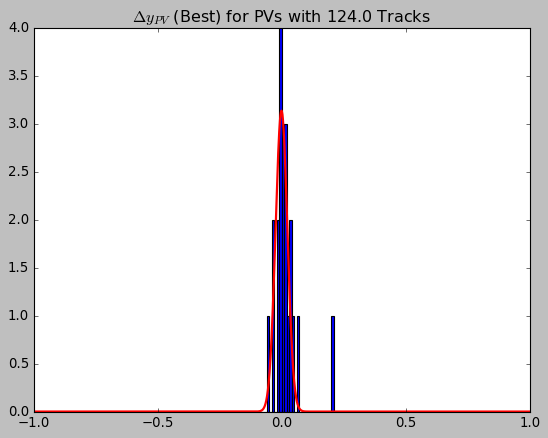

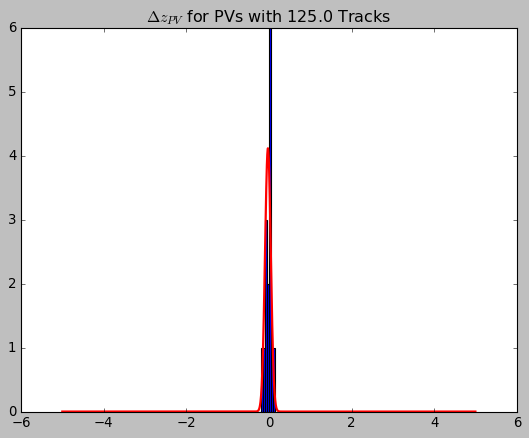

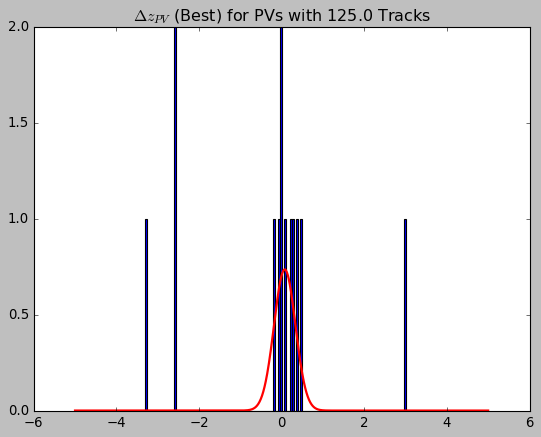

RuntimeError: Optimal parameters not found: Number of calls to function has reached maxfev = 800.

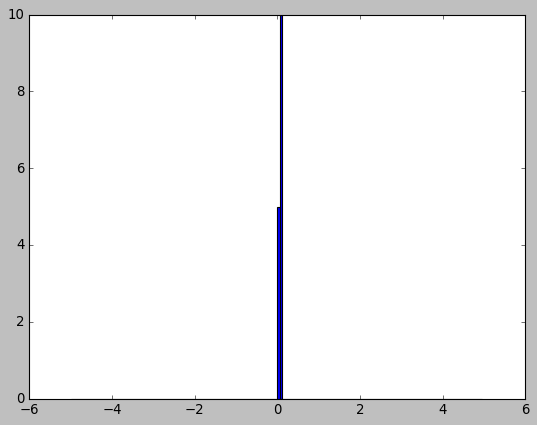

In [61]:
nums_z = []
widths_z = []
unc_z = []

nums_x = []
widths_x = []
unc_x = []

nums_y = []
widths_y = []
unc_y = []

nums_z_best = []
widths_z_best = []
unc_z_best = []

nums_x_best = []
widths_x_best = []
unc_x_best = []

nums_y_best = []
widths_y_best = []
unc_y_best = []

nums_z_pvf = []
widths_z_pvf = []
unc_z_pvf = []


for n in sorted(resolution_dict_z.keys())[5:]:
    
    
    bins = np.arange(-5,5,0.05)
    vals, bins, patches = plt.hist(resolution_dict_z[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-5,5,0.005)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta z_{PV}$ for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_z.append(n)
    widths_z.append(abs(coeff[2]))
    unc_z.append(np.sqrt(np.abs(var_matrix[2,2])))
    
    bins = np.arange(-5,5,0.05)
    vals, bins, patches = plt.hist(resolution_dict_z_best[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-5,5,0.005)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta z_{PV}$ (Best) for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_z_best.append(n)
    widths_z_best.append(abs(coeff[2]))
    unc_z_best.append(np.sqrt(np.abs(var_matrix[2,2])))
    
    bins = np.arange(-5,5,0.05)
    vals, bins, patches = plt.hist(resolution_dict_z_pvf[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-5,5,0.005)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta z_{PV}$ (pv-finder) for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_z_pvf.append(n)
    widths_z_pvf.append(abs(coeff[2]))
    unc_z_pvf.append(np.sqrt(np.abs(var_matrix[2,2])))
    
    bins = np.arange(-1,1,0.01)
    vals, bins, patches = plt.hist(resolution_dict_x[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-1,1,0.001)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta x_{PV}$ for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_x.append(n)
    widths_x.append(abs(coeff[2]))
    unc_x.append(np.sqrt(np.abs(var_matrix[2,2])))
    
    bins = np.arange(-1,1,0.01)
    vals, bins, patches = plt.hist(resolution_dict_x_best[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-1,1,0.001)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta x_{PV}$ (Best) for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_x_best.append(n)
    widths_x_best.append(abs(coeff[2]))
    unc_x_best.append(np.sqrt(np.abs(var_matrix[2,2])))
    
    bins = np.arange(-1,1,0.01)
    vals, bins, patches = plt.hist(resolution_dict_y[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-1,1,0.001)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta y_{PV}$ for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_y.append(n)
    widths_y.append(abs(coeff[2]))
    unc_y.append(np.sqrt(np.abs(var_matrix[2,2])))
    
    bins = np.arange(-1,1,0.01)
    vals, bins, patches = plt.hist(resolution_dict_y_best[n],bins=bins)
    coeff, var_matrix = curve_fit(gauss_fitfunction, bins[:-1], vals, p0=[10,0,0.1])
    xfit = np.arange(-1,1,0.001)
    plt.plot(xfit, gauss_fitfunction(xfit,coeff[0],coeff[1],coeff[2]),'-',color='r',linewidth=2)
    title = '$\Delta y_{PV}$ (Best) for PVs with ' + str(n) + ' Tracks'
    plt.title(title)
    plt.show()
    
    nums_y_best.append(n)
    widths_y_best.append(abs(coeff[2]))
    unc_y_best.append(np.sqrt(np.abs(var_matrix[2,2])))

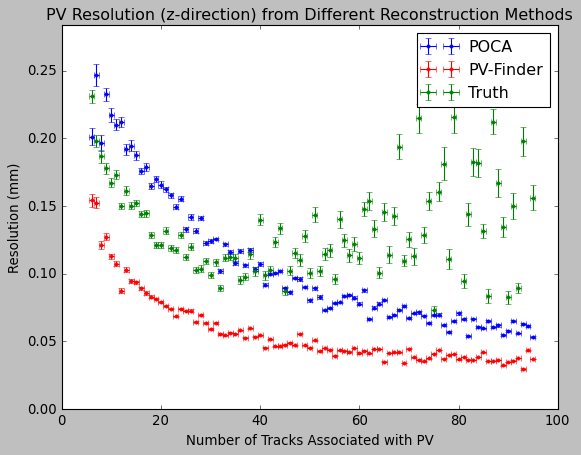

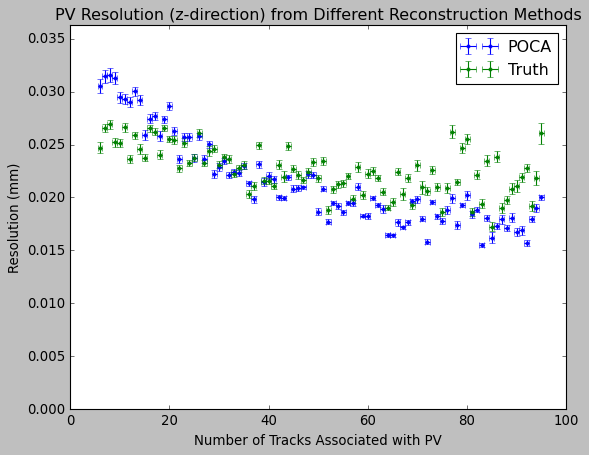

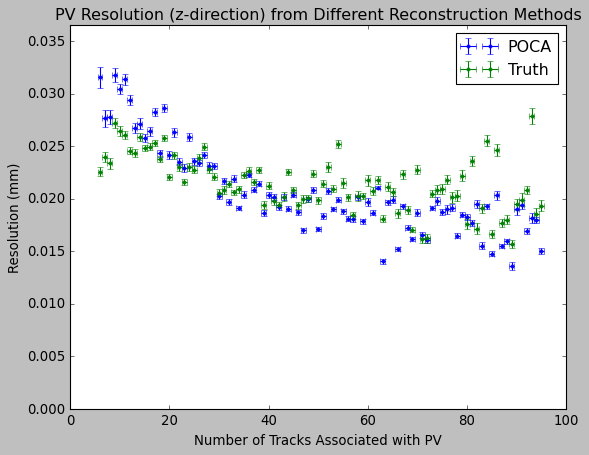

In [62]:
plt.errorbar(nums_z[:90], widths_z[:90], xerr = 1/2, yerr = np.array(unc_z[:90]), marker = '.', linestyle = '', color = 'b')
plt.errorbar(nums_z_pvf[:90], widths_z_pvf[:90], xerr = 1/2, yerr = np.array(unc_z_pvf[:90]), marker = '.', linestyle = '', color = 'r')
plt.errorbar(nums_z_best[:90], widths_z_best[:90], xerr = 1/2, yerr = np.array(unc_z_best[:90]), marker = '.', linestyle = '', color = 'g')
plt.legend(['POCA', 'PV-Finder', 'Truth'])
plt.xlim([0,100])
plt.ylim([0,1.15*max(widths_z[:70])])
plt.ylabel('Resolution (mm)')
plt.xlabel('Number of Tracks Associated with PV')
plt.title('PV Resolution (z-direction) from Different Reconstruction Methods')
plt.show()

plt.errorbar(nums_x[:90], widths_x[:90], xerr = 1/2, yerr = np.array(unc_x[:90]), marker = '.', linestyle = '', color = 'b')
plt.errorbar(nums_x_best[:90], widths_x_best[:90], xerr = 1/2, yerr = np.array(unc_x_best[:90]), marker = '.', linestyle = '', color = 'g')
plt.legend(['POCA', 'Truth'])
plt.xlim([0,100])
plt.ylim([0,1.15*max(widths_x[:70])])
plt.ylabel('Resolution (mm)')
plt.xlabel('Number of Tracks Associated with PV')
plt.title('PV Resolution (z-direction) from Different Reconstruction Methods')
plt.show()

plt.errorbar(nums_y[:90], widths_y[:90], xerr = 1/2, yerr = np.array(unc_y[:90]), marker = '.', linestyle = '', color = 'b')
plt.errorbar(nums_y_best[:90], widths_y_best[:90], xerr = 1/2, yerr = np.array(unc_y_best[:90]), marker = '.', linestyle = '', color = 'g')
plt.legend(['POCA', 'Truth'])
plt.xlim([0,100])
plt.ylim([0,1.15*max(widths_y[:70])])
plt.ylabel('Resolution (mm)')
plt.xlabel('Number of Tracks Associated with PV')
plt.title('PV Resolution (z-direction) from Different Reconstruction Methods')
plt.show()

Text(0, 0.5, 'Ratio of Correctly Matched Tracks/Total')

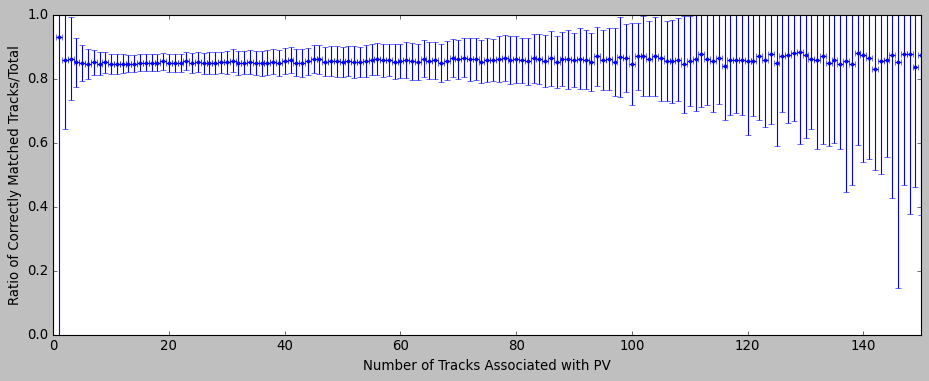

In [63]:
n_vals = ratio_dict.keys()
ratios = np.zeros(len(n_vals))
unc = np.zeros(len(n_vals))
for i,n in enumerate(n_vals):
    ratios[i] = np.average(ratio_dict[n])
    unc[i] = 1/np.sqrt(len(ratio_dict[n]))
plt.figure(figsize=(14, 5))
plt.errorbar(n_vals, ratios, xerr = 1/2, yerr = unc, linestyle = '', marker = '.')
plt.xlim([0,150])
plt.ylim([0,1])
plt.xlabel('Number of Tracks Associated with PV')
plt.ylabel('Ratio of Correctly Matched Tracks/Total')

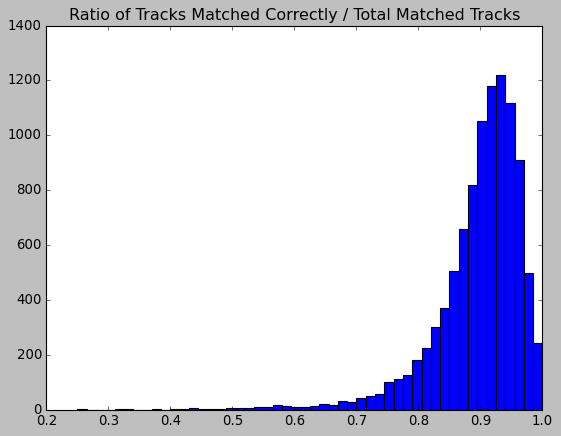

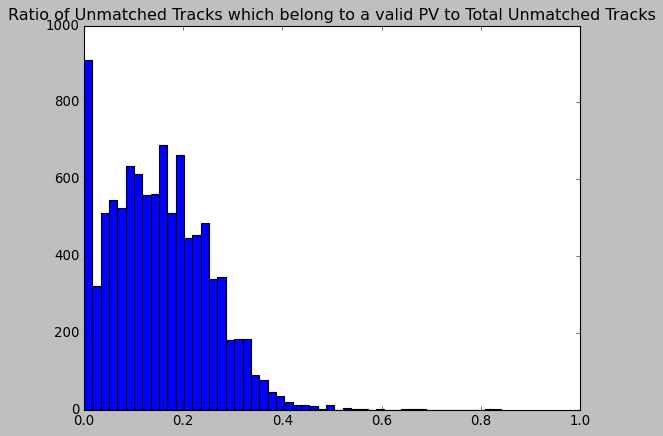

In [64]:
plt.hist(correct_ratio,bins=50)
plt.title("Ratio of Tracks Matched Correctly / Total Matched Tracks")
plt.show()

plt.hist(missed_ratio,bins=50)
plt.title("Ratio of Unmatched Tracks which belong to a valid PV to Total Unmatched Tracks")
plt.show()

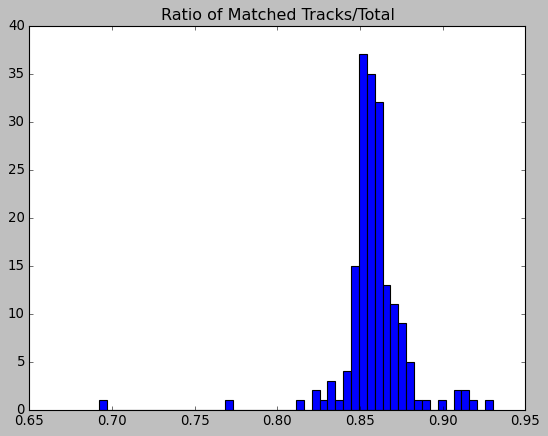

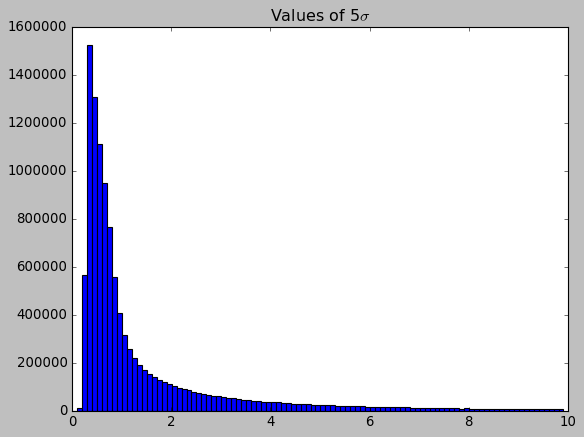

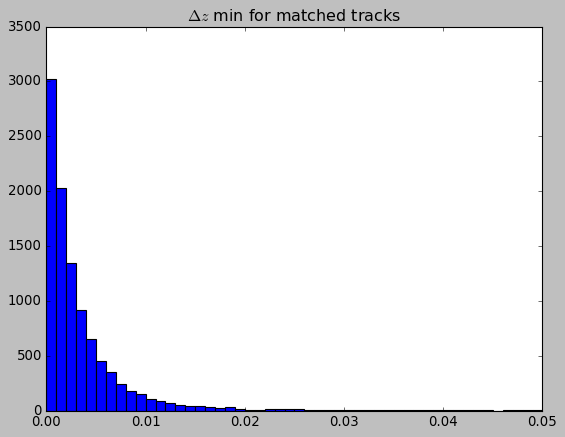

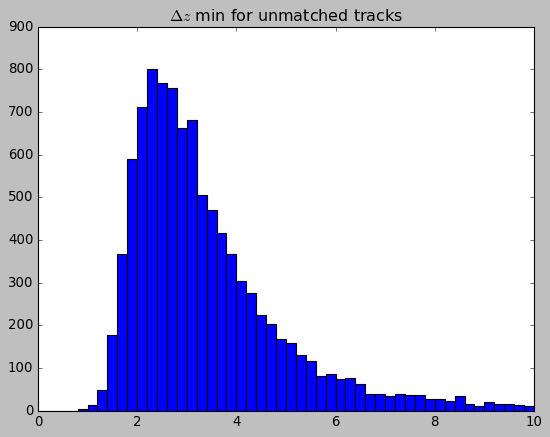

In [65]:
plt.hist(ratios, bins=50)
plt.title("Ratio of Matched Tracks/Total")
plt.show()

sbins = np.arange(0.01,10.01,0.1)
plt.hist(5*stds, bins=sbins)
plt.title("Values of 5$\sigma$")
plt.show()

plt.hist(deltazmin_matched, bins=50, range=[0,0.05])
plt.title("$\Delta z$ min for matched tracks")
plt.show()

plt.hist(deltazmin_unmatched, bins=50, range=[0,10])
plt.title("$\Delta z$ min for unmatched tracks")
plt.show()

In [66]:
print(stds[0:100])

[2.0236856737563667, 11.24487746390812, 30.767137315007012, 12.250662516550957, 6.1579665196488, 13.340508195305208, 17.663174936414315, 6.863405236738666, 4.889384471300825, 6.399411542881016, 6.0473691721275245, 5.177657910264941, 6.648726734838117, 3.6670764721093567, 2.683081925119519, 2.5923056942517304, 3.5211435976003864, 2.320628817284714, 3.507122869976736, 5.370287463514581, 3.4348860127578855, 2.660287404753562, 3.761138937403294, 2.994910360999345, 1.9881622107347328, 1.3724734047463834, 2.5045326875545246, 2.2957035727148574, 2.4262660895677164, 2.8779150170724916, 0.6785411487471177, 1.5498571085538213, 5.433702206367378, 1.685520401347276, 2.2347652491746817, 2.2231463526272317, 1.253330512896205, 2.376045010615238, 2.289669890490116, 1.727867933442727, 2.6131991195278554, 1.315363992523145, 0.4700815536232016, 0.5525724099139605, 0.6760133464084888, 4.218438984586134, 1.3550843638508463, 2.111524651842099, 1.079277807790703, 1.4039110128151293, 1.1933367521714262, 1.455